# Image Processing 101

Simple examples of image processing concepts on OpenCV. Concepts explored:

* Data structures
* Color and color conversions
* Thresholding and masking
* Blurring
* Contours and bounding rectangles
* Edges
* Hough Transforms

In [10]:
!wget -O coins.jpg https://upload.wikimedia.org/wikipedia/en/thumb/7/75/SA_Coins_1961-1964.JPG/1223px-SA_Coins_1961-1964.JPG

--2017-07-05 13:12:35--  https://upload.wikimedia.org/wikipedia/en/thumb/7/75/SA_Coins_1961-1964.JPG/1223px-SA_Coins_1961-1964.JPG
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177589 (173K) [image/jpeg]
Saving to: ‘coins.jpg’

coins.jpg           100%[===================>] 173.43K   202KB/s    in 0.9s    

2017-07-05 13:12:37 (202 KB/s) - ‘coins.jpg’ saved [177589/177589]



In [11]:
!ls images

0001a.jpg	0032.jpg  0056.png  0081.jpg	  alargeplanet.png
0001.jpg	0032.png  0057.jpg  0081.png	  amarket.jpg
0001.png	0033.jpg  0057.png  0082.png	  ant.png
0001.thumbnail	0033.png  0058.jpg  0083.jpg	  ariver002.jpg
0002.jpg	0034.png  0058.png  0083.png	  ariver.jpg
0002.png	0035.png  0059.jpg  0084.jpg	  asky.JPG
0003.jpg	0036.jpg  0059.png  0084.png	  a_test.png
0004.jpg	0037.jpg  0060.jpg  0085.jpg	  athought.JPG
0004.png	0037.png  0060.png  0085.png	  awaterfall.jpg
0005.jpg	0038.jpg  0061.png  0086.jpg	  d-0020.png.jpg
0005.png	0038.png  0062.jpg  0086.png	  dream-bordered.jpg
0007.jpg	0039.jpg  0063.jpg  0087.jpg	  elephant.jpg
0008.jpg	0039.png  0063.png  0087.png	  face.jpg
0008.png	0040.jpg  0064.jpg  0088.jpg	  Fract2.jpg
0009.jpg	0040.png  0064.png  0088.png	  gray_con.png
0009.png	0042.jpg  0066.jpg  0089.jpg	  gray_conrgb.png
0010.jpg	0042.png  0066.png  0089.png	  gray_conrgbtran.png
0011.jpg	0043.png  0068.jpg  0090.jpg	  imagenet-sample.jpg
0012.jpg	0044.jpg  0068.png

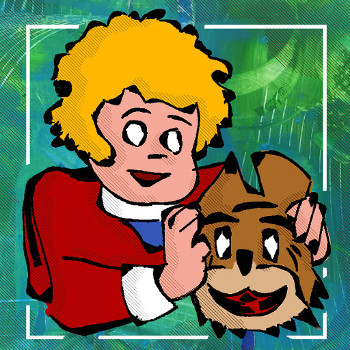

In [12]:
import Mimages
from Mimages import pic
pic.load("images/ophanannie.jpg")

In [13]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

## Basic data structures in OpenCV

In [14]:
# read an image
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('coins.jpg')

cv2.imwrite("coins.png", img)

True

In [15]:
# read an image
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')

# show image format (basically a 3-d array of pixel color info, in BGR format)
print(img)

[[[ 91 125  25]
  [ 88 125  23]
  [ 96 119  34]
  ..., 
  [105 150  47]
  [112 161  39]
  [115 153  63]]

 [[104 127  21]
  [ 96 125  39]
  [136 135  37]
  ..., 
  [ 87 122  65]
  [ 96 143  45]
  [127 180  63]]

 [[ 93 109  32]
  [128 130  30]
  [139 123  23]
  ..., 
  [125 189  63]
  [ 78 119  62]
  [ 94 152  43]]

 ..., 
 [[130 134  45]
  [ 71 117  58]
  [140 170  43]
  ..., 
  [ 55  63  52]
  [179 133  38]
  [158 127   6]]

 [[117 189  35]
  [133 149  62]
  [ 85 134  52]
  ..., 
  [177 140  26]
  [ 83  82  48]
  [162 127  23]]

 [[110 171  75]
  [127 181  60]
  [127 164  42]
  ..., 
  [154 128  28]
  [172 135  15]
  [ 83  72  44]]]


### Colors and color conversions

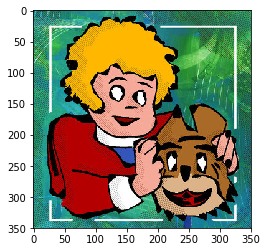

In [16]:
# convert image to RGB color for matplotlib
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# show image with matplotlib
plt.imshow(img)

In [17]:
# convert image to grayscale
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# grayscale image represented as a 2-d array
print(gray_img)

[[ 91  90  91 ..., 114 119 122]
 [ 93  96 106 ..., 101 108 139]
 [ 84 100  95 ..., 144  97 113]
 ..., 
 [107  94 129 ...,  59 110  94]
 [135 121 104 ..., 110  72 100]
 [135 139 123 ..., 101 103  65]]


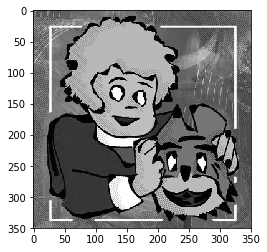

In [18]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# have to convert grayscale back to RGB for plt.imshow()
plt.imshow(cv2.cvtColor(gray_img, cv2.COLOR_GRAY2RGB))

### Finding the average color of an image

In [19]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# find average per row
# np.average() takes in an axis argument which finds the average across that axis. 
average_color_per_row = np.average(img, axis=0)

# find average across average per row
average_color = np.average(average_color_per_row, axis=0)

# convert back to uint8
average_color = np.uint8(average_color)
print(average_color)


[114 115  77]


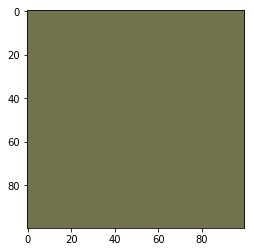

In [20]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# create 100 x 100 pixel array with average color value
average_color_img = np.array([[average_color]*100]*100, np.uint8)

plt.imshow(average_color_img)

---

## Binary thresholding

Examples using thresholding on brightness/darkness of grayscale image and on color ranges


### Binary thresholding on grayscale image

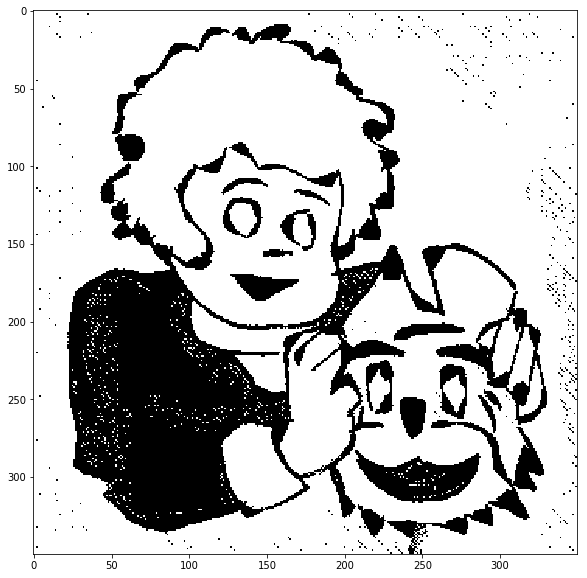

In [21]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# threshold for grayscale image
_, threshold_img = cv2.threshold(gray_img, 60, 255, cv2.THRESH_BINARY)

threshold_img = cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2RGB)
plt.figure(figsize=(10,10))
plt.imshow(threshold_img)

### Binary thresholding on color

In [22]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)

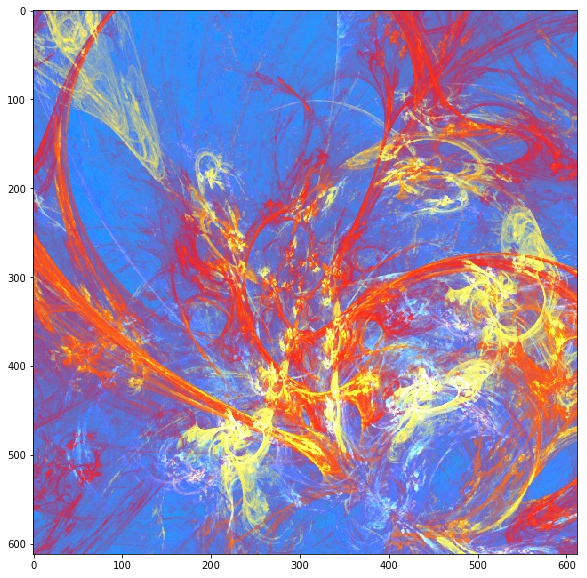

In [23]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(fract, cv2.COLOR_BGR2RGB))

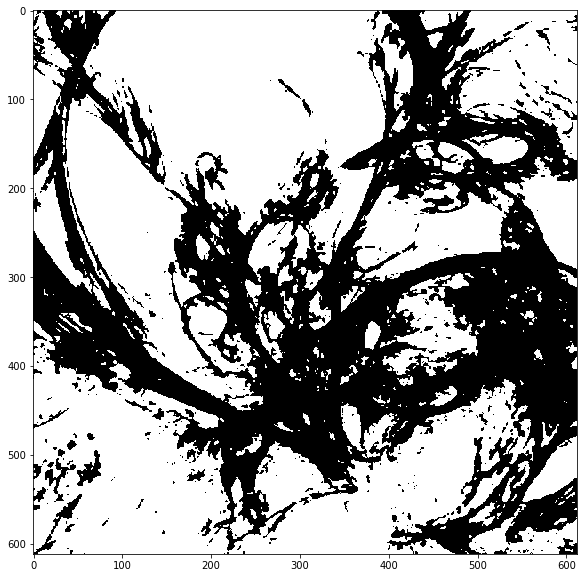

In [24]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# threshold for hue channel in blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

# show threshold bits
threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)
plt.figure(figsize=(10,10))
plt.imshow(threshold_blue_img)

### Using binary thresholding to obtain an image mask

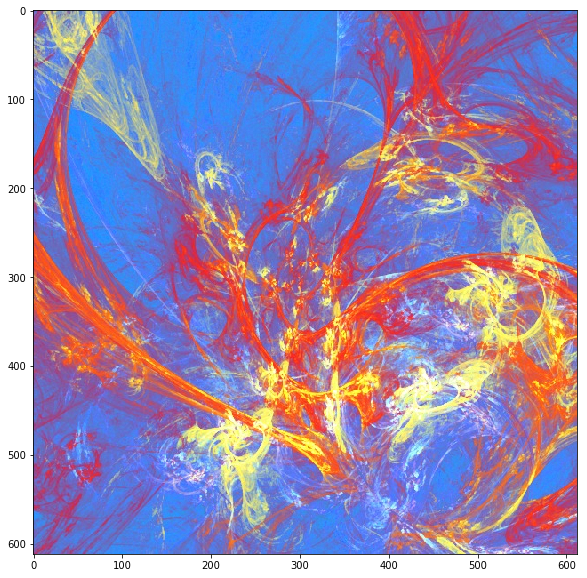

In [25]:
upstate = cv2.imread('images/0064.jpg')
upstate_hsv = cv2.cvtColor(upstate, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(upstate_hsv, cv2.COLOR_HSV2RGB))

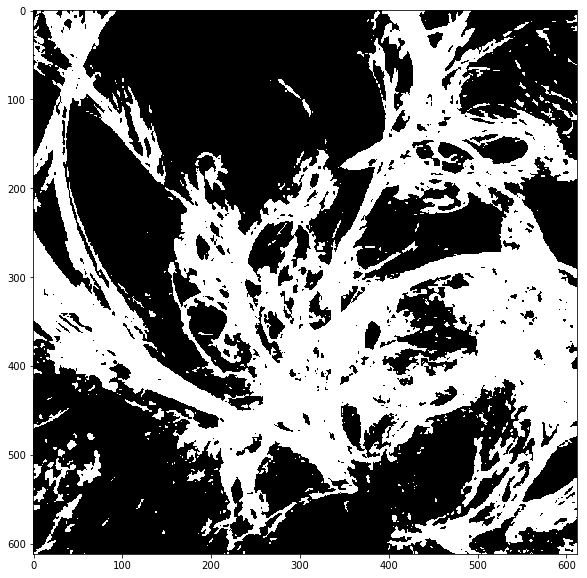

In [26]:
mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB))

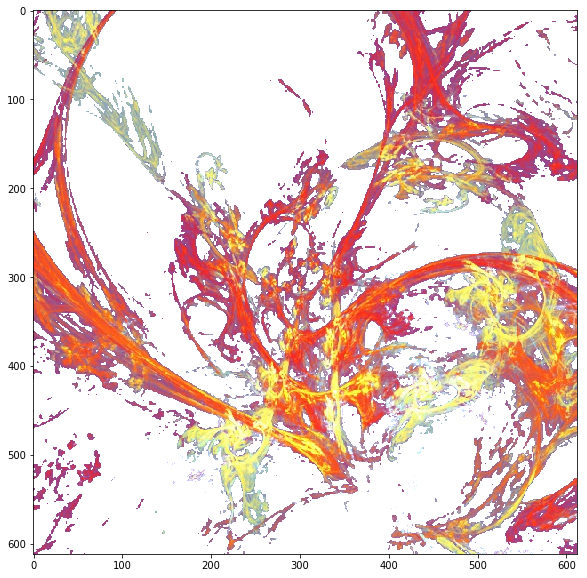

In [27]:
# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(upstate, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

# All-In-One Mask

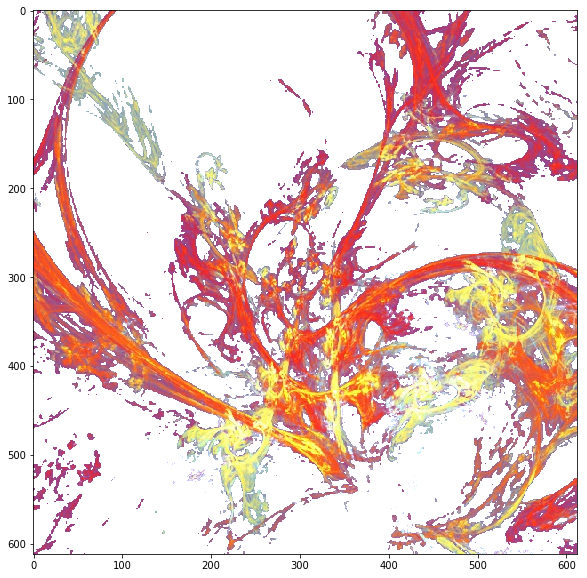

In [28]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)
# threshold for blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)


#mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask_inverse = cv2.inRange(fract_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(fract, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))


---

## Gaussian Blur

Gaussian blurring in action, and how it makes a difference in the binary image that it produces

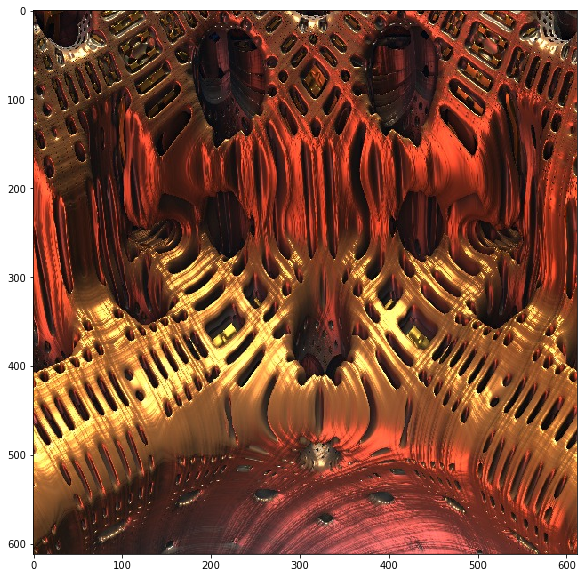

In [29]:
img = cv2.imread('images/0074.jpg')

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


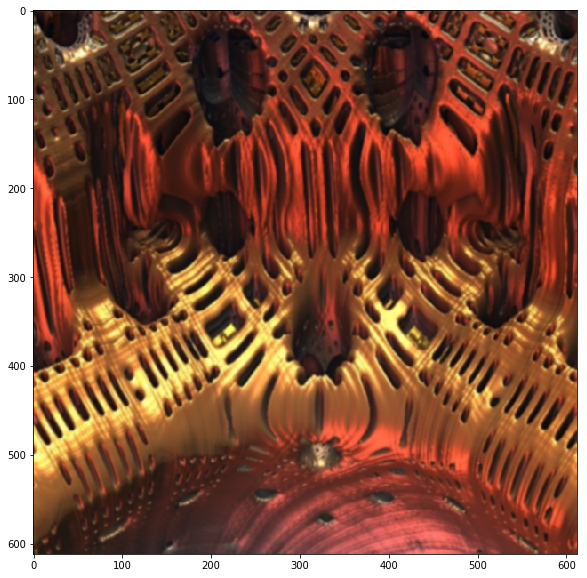

In [30]:
# preproccess with blurring, with 5x5 kernel
img_blur_small = cv2.GaussianBlur(img, (5,5), 0)
cv2.imwrite('output/0074.jpg', img_blur_small)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2RGB))

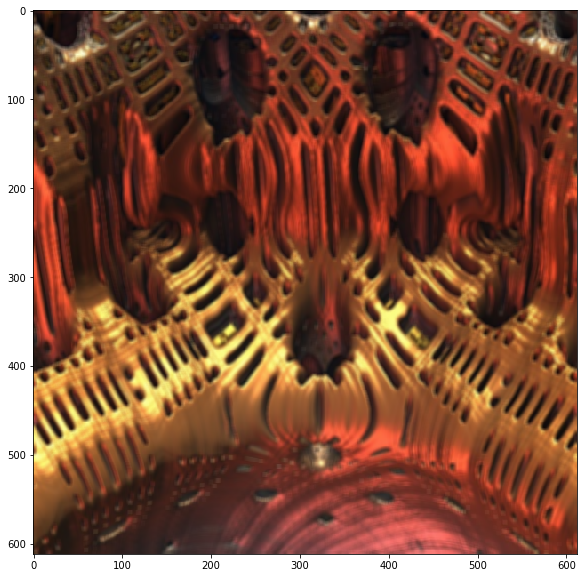

In [31]:
img_blur_small = cv2.GaussianBlur(img, (5,5), 25)
cv2.imwrite('output/0074.jpg', img_blur_small)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2RGB))

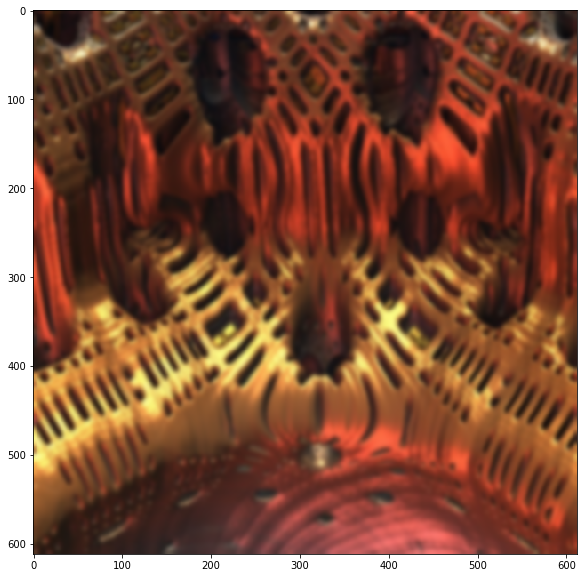

In [32]:
img_blur_large = cv2.GaussianBlur(img, (15,15), 0)
cv2.imwrite('output/0074.jpg', img_blur_large)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_large, cv2.COLOR_BGR2RGB))

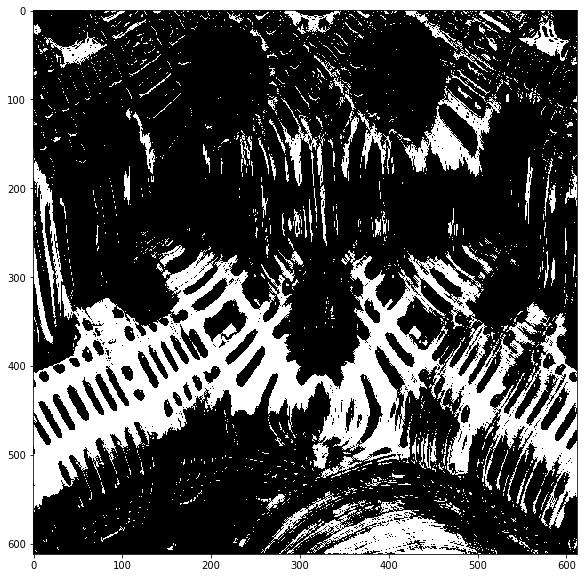

In [33]:
# threshold on regular image
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/0075b.jpg', threshold_img)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2RGB))

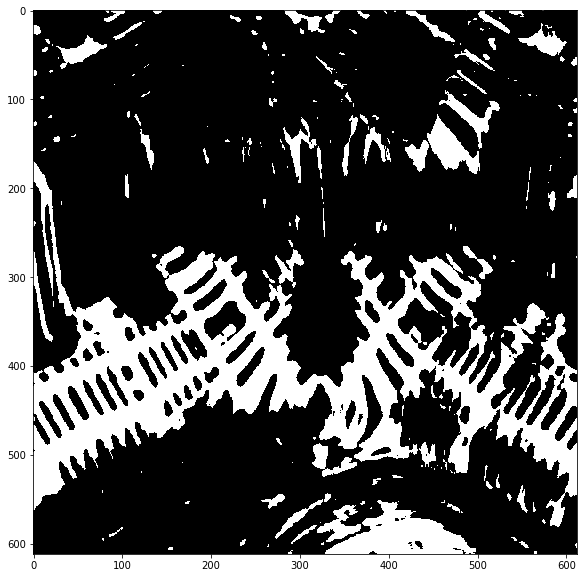

In [34]:
#threshold on blurred image
gray_blur_img = cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2GRAY)
_, threshold_img_blur = cv2.threshold(gray_blur_img, 100, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/0075tblur.jpg', threshold_img_blur)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(threshold_img_blur, cv2.COLOR_GRAY2RGB))

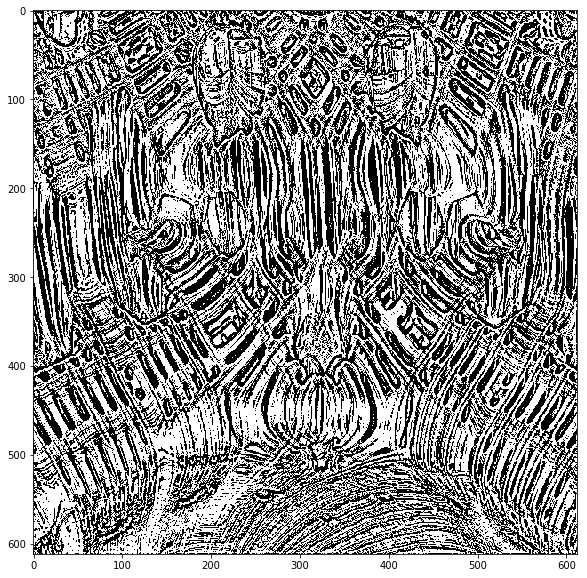

In [35]:
# using adaptive threshold instead of global
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(adaptive_thresh, cv2.COLOR_GRAY2RGB))

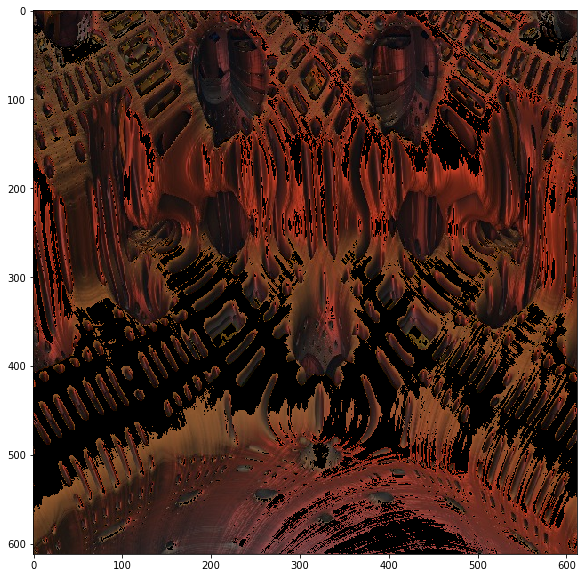

In [36]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
#gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
#                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
#                                         cv2.THRESH_BINARY,11,2)


gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)

mask = cv2.bitwise_not(threshold_img)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

plt.figure(figsize=(10,10))
# View with white instead of black - example below:

plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))

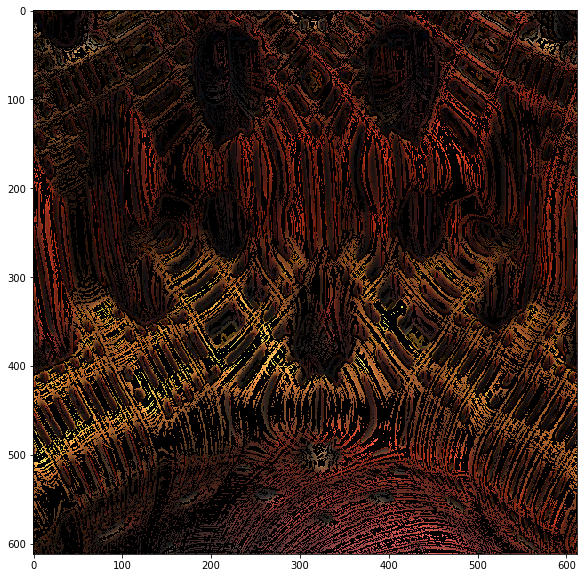

In [37]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
mask = cv2.bitwise_not(adaptive_thresh)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

plt.figure(figsize=(10,10))
# View with white instead of black - example below:

plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))

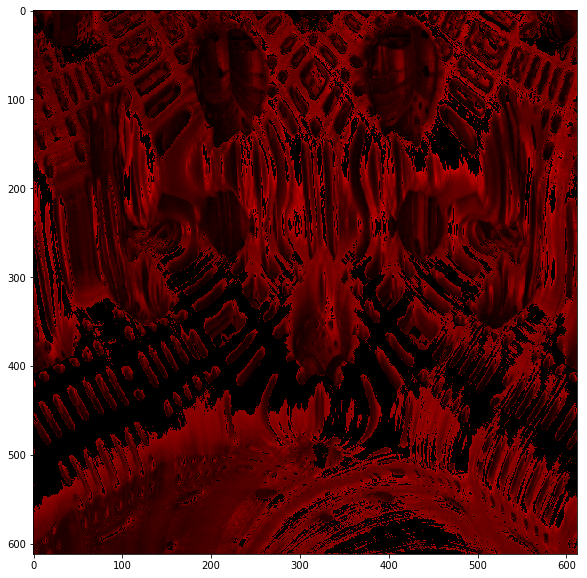

In [38]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
#gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
#                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
#                                         cv2.THRESH_BINARY,11,2)


gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)

mask = cv2.bitwise_not(threshold_img)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue

mask_rgb[mask == 255] = [0, 0, 255]
masked_upstate = cv2.bitwise_and(img, mask_rgb)




plt.figure(figsize=(10,10))
# View with white instead of black - example below:


cv2.imwrite('red.jpg', masked_upstate)
plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))



In [39]:
# Make the black transparent
import cv2
file_name = "red.jpg"
src = cv2.imread(file_name, 1)
tmp = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
_,alpha = cv2.threshold(tmp,20,255,cv2.THRESH_BINARY)
b, g, r = cv2.split(src)
rgba = [b,g,r, alpha]
dst = cv2.merge(rgba,4)
cv2.imwrite("test.png", dst)

True

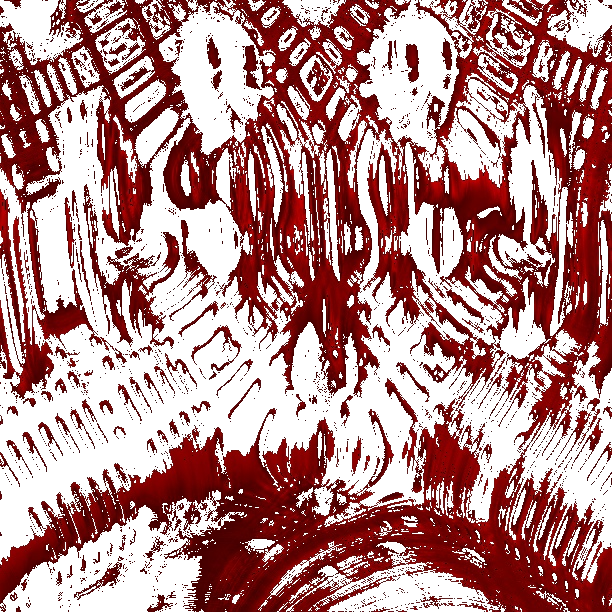

In [40]:
#View the new transparent image
from PIL import Image
newIM =Image.open("test.png")
newIM

In [41]:
import numpy as np
import cv2

img1 = cv2.imread("test1.png", -1)
img2 = cv2.imread("test.png", -1) # this one has transparency
h, w, depth = img2.shape

result = np.zeros((h, w, 3), np.uint8)

for i in range(h):
    for j in range(w):
        color1 = img1[i, j]
        color2 = img2[i, j]
        alpha = color2[3] / 255.0
        new_color = [ (1 - alpha) * color1[0] + alpha * color2[0],
                      (1 - alpha) * color1[1] + alpha * color2[1],
                      (1 - alpha) * color1[2] + alpha * color2[2] ]
        result[i, j] = new_color

cv2.imshow("result", result)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [140]:
import os
import Mimages
from Mimages import pic
help(Mimages.pic)

Help on module Mimages.pic in Mimages:

NAME
    Mimages.pic

FILE
    /home/jack/anaconda2/lib/python2.7/site-packages/Mimages/pic.py

FUNCTIONS
    blend_transparent(face_img, overlay_t_img, result_sav)
    
    load(img)




In [67]:
import cv2
help(cv2)

Help on module cv2:

NAME
    cv2

FILE
    /home/jack/anaconda2/lib/python2.7/site-packages/cv2.so

SUBMODULES
    Error
    aruco
    bgsegm
    bioinspired
    cuda
    datasets
    detail
    dnn
    face
    fisheye
    flann
    freetype
    ft
    hdf
    instr
    line_descriptor
    ml
    motempl
    multicalib
    ocl
    ogl
    omnidir
    optflow
    plot
    ppf_match_3d
    rgbd
    saliency
    structured_light
    text
    videostab
    xfeatures2d
    ximgproc
    xphoto

CLASSES
    __builtin__.object
        UMat
    exceptions.Exception(exceptions.BaseException)
        error
    
    class UMat(__builtin__.object)
     |  OpenCV 3 UMat wrapper. Used for T-API support.
     |  
     |  Methods defined here:
     |  
     |  __init__(...)
     |      x.__init__(...) initializes x; see help(type(x)) for signature
     |  
     |  get(...)
     |      Returns numpy array
     |  
     |  ----------------------------------------------------------------------
     |  D

In [137]:
%%writefile /home/jack/anaconda2/lib/python2.7/site-packages/Mimages/pic.py
#!/home/jack/anaconda2/bin/python
import importlib
from PIL import Image
import sys
sys.path.insert(1, "/home/jack/anaconda2/lib/python2.7/site-packages/cv2.so")
import cv2
def load(img):
        #seeit = Image.open("Mimages/stuff/desert.jpg")
        seeit = Image.open(img)
        #seeit = Image.open("Mimages/stuff/desert.jpg")
        return seeit
        load(image)
        seeit
# Usage blend(image1, image2, alpha_blend(0-1), save_as)
# Usage blend("640.png", "640spider.png", .5, "spider_new.png")
#images must match size and format 
def blend(image1="640.png", image2="640spider.png", alpha=.5, mimsave="spider_new.png"):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        
        

Overwriting /home/jack/anaconda2/lib/python2.7/site-packages/Mimages/pic.py


In [94]:
def blend(image1, image2, alpha, mimsave):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        

In [134]:
!cp 640spider.png /home/jack/anaconda2/lib/python2.7/site-packages/Mimages

In [123]:
def blend(image1="640.png", image2="640spider.png", alpha=.5, mimsave="spider_new.png"):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        

In [136]:
from Mimages import pic
#blend("merged_test1-test2.png", "TEMP-img.png", .5, "spider_.png")
blend("TEMP-img.png", "20170622-072016.png", .5, "XXspider2_.png")




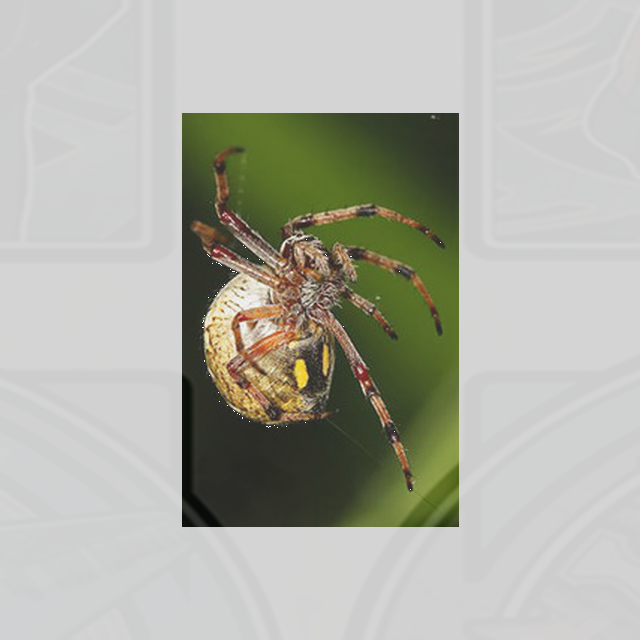

In [129]:
from Mimages import pic
pic.load("spider2_.png")
#pic.load("spider_.png")

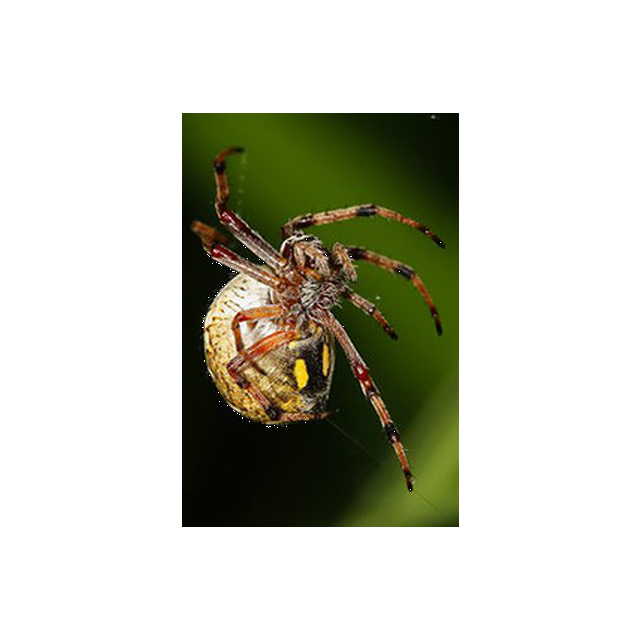

In [131]:
from Mimages import pic
pic.load("20170622-072016.png")
#pic.load("spider_.png")

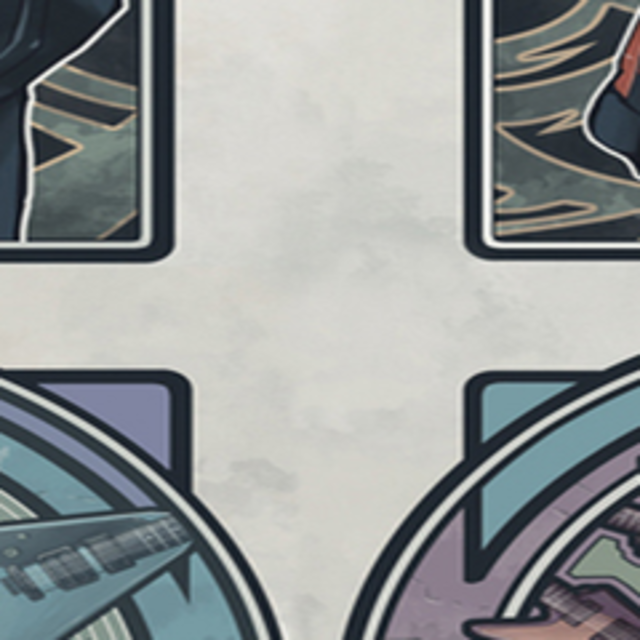

In [120]:
from Mimages import pic
pic.load("TEMP-img.png")
#pic.load("spider_.png")

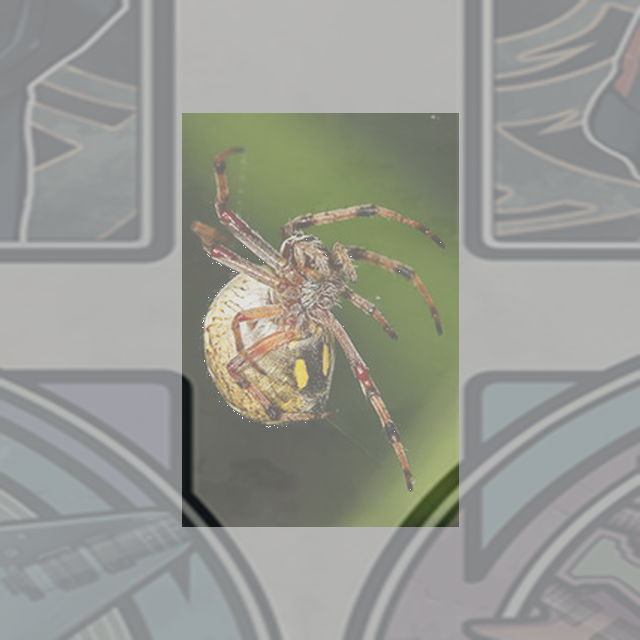

In [119]:
from Mimages import pic
pic.load("spider2_.png")
#pic.load("spider_.png")

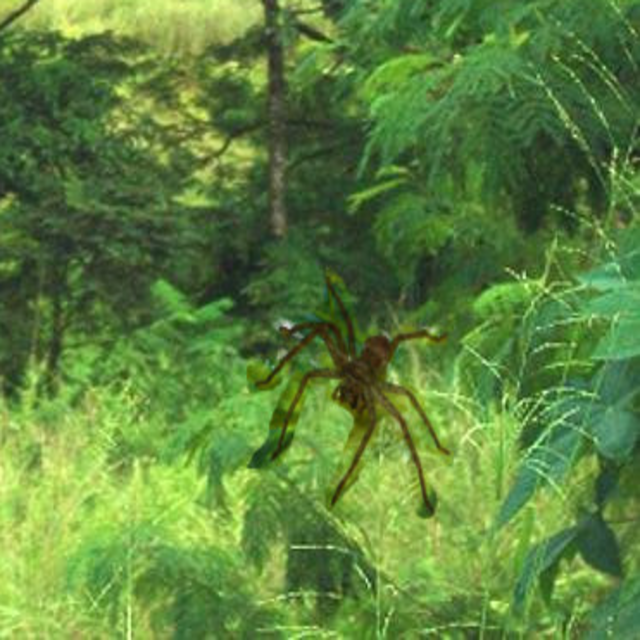

In [107]:
from Mimages import pic
pic.load("jungle2.png")

In [102]:
!ls *.png


20170621-151953.png	       Auto_Crop_20170625-202336.png
20170621-152227.png	       Auto_Crop_20170625-202354.png
20170621-152308.png	       backgrounddark.png
20170621-153607.png	       backgroundlight.png
20170621-153613.png	       bbbb_resized.png
20170621-153623.png	       binary.png
20170621-153627.png	       btr-20170622-063759.png
20170621-153632.png	       btrb-20170622-063759.png
20170621-180213.png	       cat.png
20170621-180257.png	       coins-binary.png
20170621-181230.png	       coins.png
20170621-181254.png	       coinS.png
20170621-181303.png	       collage20170617-post.png
20170621-185300.png	       collagepost20170617-133303.png
20170621-185314.png	       CONTOUR.png
20170621-185342.png	       DETAIL.png
20170621-185430.png	       dnaa.png
20170622-063759.png	       face-001.png
20170622-063814.png	       FIND_EDGES.png
20170622-064404.png	       foo.png
20170622-071253.png	       framedvideomask.png
20170622-071317.png	       image_out2.png
20170622-072016.png	      

In [37]:
#%%writefile 
import numpy as np
import cv2

def blend_transparent(face_img, overlay_t_img, result_savs):
    import cv2
    
    #face_img = cv2.imread(face_imgi)
    #overlay_t_img = cv2.imread(overlay_t_imgo, -1) # Load with transparency
    #result_sav = result_savs
    
    # Split out the transparency mask from the colour info
    overlay_img = overlay_t_img[:,:,:3] # Grab the BRG planes
    overlay_mask = overlay_t_img[:,:,3:]  # And the alpha plane

    # Again calculate the inverse mask
    background_mask = 255 - overlay_mask

    # Turn the masks into three channel, so we can use them as weights
    overlay_mask = cv2.cvtColor(overlay_mask, cv2.COLOR_GRAY2BGR)
    background_mask = cv2.cvtColor(background_mask, cv2.COLOR_GRAY2BGR)

    # Create a masked out face image, and masked out overlay
    # We convert the images to floating point in range 0.0 - 1.0
    face_part = (face_img * (1 / 255.0)) * (background_mask * (1 / 255.0))
    overlay_part = (overlay_img * (1 / 255.0)) * (overlay_mask * (1 / 255.0))

    # And finally just add them together, and rescale it back to an 8bit integer image    
    result = np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))
    return result
    result
    #face_img = cv2.imread("test1.png")
    #overlay_t_img = cv2.imread("test.png", -1) # Load with transparency
    #result_sav = "XX_test1-test2.png"
    #result = np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))    
    #blend_transparent(face_img, overlay_t_img, result_sav)
    #cv2.imwrite("ZZZ.png", result)
    


In [40]:

face_img = cv2.imread("!!!new.png")
overlay_t_img = cv2.imread("trans.png", -1) # Load with transparency
result_sav = "zzzzz2.png"
result = blend_transparent(face_img, overlay_t_img, result_sav)
cv2.imwrite("Z12Zzzz.png", result)


True

In [22]:
#WORKS  Top cell must be run first
face_img = cv2.imread("XXspider2_.png")
overlay_t_img = cv2.imread("trans.png", -1) # Load with transparency
result_sav = "zzzzz2.png"
result_2 = blend_transparent(face_img, overlay_t_img, result_sav)



In [20]:
#WORKS  Top cell must be run first
result_2 = blend_transparent("XXspider2_.png", "trans.png", "zyy-test2.png")
cv2.imwrite("ZZzzz.png", result_2)


TypeError: string indices must be integers, not tuple

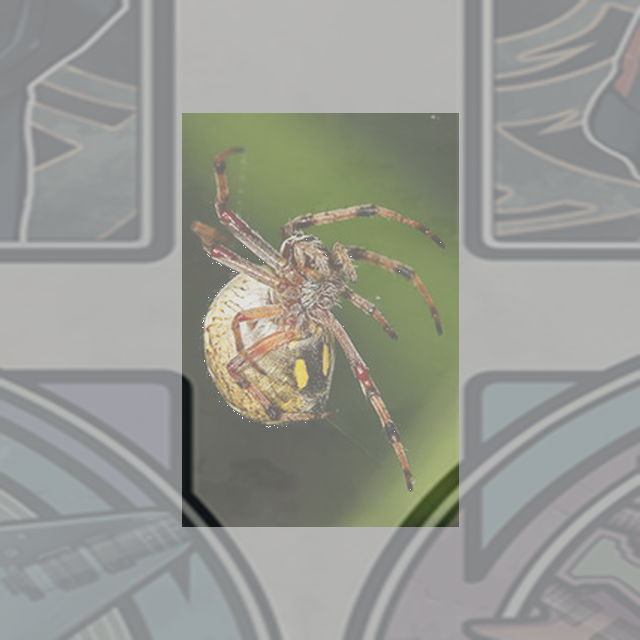

In [227]:
from Mimages import pic
pic.load("XXspider2_.png")

In [163]:
blend_transparent("/home/jack/Desktop/deep-dream-generator/notebooks/spider_.png", \
                      "/home/jack/Desktop/deep-dream-generator/notebooks/spider3.png", \
                      "/home/jack/Desktop/deep-dream-generator/notebooks/!!_test1-test2.png")

TypeError: string indices must be integers, not tuple

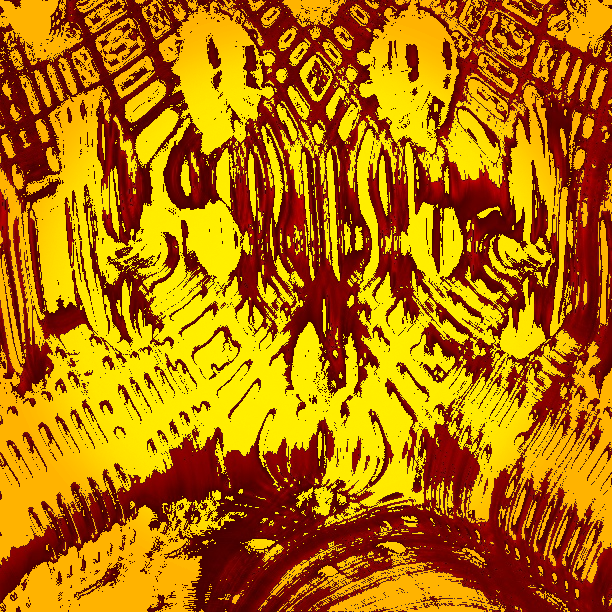

In [73]:
from Mimages import pic
pic.load("SSXX_test1-test2.png")

In [75]:
import Mimages
from Mimages import pic
import cv2
#face_img ="/home/jack/Desktop/deep-dream-generator/notebooks/images/0025.png"
#overlay_t_img = "/home/jack/Desktop/deep-dream-generator/notebooks/test.png"
#result_sav = "/home/jack/Desktop/deep-dream-generator/notebooks/!!_test1-test2.png"
pic.blend_transparent(face_img ="/home/jack/Desktop/deep-dream-generator/notebooks/images/0025.png", \
                      overlay_t_img = "/home/jack/Desktop/deep-dream-generator/notebooks/test.png", \
                      result_sav = "/home/jack/Desktop/deep-dream-generator/notebooks/!!_test1-test2.png")

NameError: global name 'cv2' is not defined

In [64]:
import Mimages
from Mimages import pic

In [ ]:
face_img = cv2.imread("test1.png")
overlay_t_img = cv2.imread("test.png", -1) # Load with transparency
result_sav = "XX_test1-test2.png"
result_2 = blend_transparent(face_img, overlay_t_img, result_sav)



In [ ]:

import numpy as np
import cv2

def blend_transparent(face_img, overlay_t_img):
    # Split out the transparency mask from the colour info
    overlay_img = overlay_t_img[:,:,:3] # Grab the BRG planes
    overlay_mask = overlay_t_img[:,:,3:]  # And the alpha plane

    # Again calculate the inverse mask
    background_mask = 255 - overlay_mask

    # Turn the masks into three channel, so we can use them as weights
    overlay_mask = cv2.cvtColor(overlay_mask, cv2.COLOR_GRAY2BGR)
    background_mask = cv2.cvtColor(background_mask, cv2.COLOR_GRAY2BGR)

    # Create a masked out face image, and masked out overlay
    # We convert the images to floating point in range 0.0 - 1.0
    face_part = (face_img * (1 / 255.0)) * (background_mask * (1 / 255.0))
    overlay_part = (overlay_img * (1 / 255.0)) * (overlay_mask * (1 / 255.0))

    # And finally just add them together, and rescale it back to an 8bit integer image    
    return np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))

# We load the images
face_img = cv2.imread("test1.png")
overlay_t_img = cv2.imread("test.png", -1) # Load with transparency

result_2 = blend_transparent(face_img, overlay_t_img)
cv2.imwrite("merged_test1-test2.png", result_2)



In [ ]:
import cv2
import PIL
import numpy as np
from PIL import Image
image1 = Image.open("test1.png")
image2 = Image.open("test.png") 

new = Image.alpha_composite(image1, image2)
new

In [ ]:
import cv2
import PIL
import numpy as np
from PIL import Image
image1 = Image.open("test1.png")
image2 = Image.open("test.png") 
image3 = Image.open("output/0075tblur.jpg")
compim = Image.composite(image1, image2, image3)
compim

compim.save("compimange.jpg", "JPEG")

In [ ]:
#View the new transparent image
from PIL import Image
newIm =Image.open("compimange.jpg")
newIm

In [ ]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
mask = cv2.bitwise_not(adaptive_thresh)
# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

# replace the cut-out parts with white - experiment with the 1 in the added weight ( 1 - 255 )
masked_replace_white = cv2.addWeighted(masked_upstate, 2, \
                                       cv2.cvtColor(adaptive_thresh, cv2.COLOR_GRAY2RGB), 1, 0)

plt.figure(figsize=(10,10))

# View with white instead of black - plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

In [ ]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
# Convert to HSV
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)
# Set threshold for blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
# Create new object with blue thresholdapplied
#threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

#threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)


#mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask_inverse = cv2.inRange(fract_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(fract, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))

#(white background) - plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))
#(black-background) - plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

---

## Contour and bounding boxes

In [ ]:
import PIL
from PIL import Image

basewidth = 600
img = Image.open('coins.png')
wpercent = (basewidth/float(img.size[0]))
hsize = int((float(img.size[1])*float(wpercent)))
img = img.resize((basewidth,hsize), PIL.Image.ANTIALIAS)
img.save('coinS.png') 

In [ ]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

coins = cv2.imread('coinS.png')
plt.imshow(cv2.cvtColor(coins, cv2.COLOR_BGR2RGB))
cv2.imwrite('coinS-orig.jpg', coins)

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img = cv2.imread('coinS.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

plt.imshow(thresh)

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img = cv2.imread('coinS.png')
coins_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

coins_preprocessed = cv2.GaussianBlur(coins_gray, (5, 5), 0)
plt.imshow(cv2.cvtColor(coins_preprocessed, cv2.COLOR_GRAY2RGB))

In [ ]:
_, coins_binary = cv2.threshold(coins_preprocessed, 130, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary = cv2.bitwise_not(coins_binary)
plt.imshow(cv2.cvtColor(coins_binary, cv2.COLOR_GRAY2RGB))
cv2.imwrite('coins-binary.png', coins_binary)

In [ ]:
# morph coins by eroding and dilating to remove noise
morph_kernel = np.ones((15,15),np.uint8)
coins_morph = cv2.morphologyEx(coins_binary, cv2.MORPH_CLOSE, morph_kernel)

plt.imshow(cv2.cvtColor(coins_morph, cv2.COLOR_GRAY2RGB))

---
### Get countours

In [ ]:
# find contours
_, coins_contours, _ = cv2.findContours(coins_morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# make copy of image
coins_and_contours = np.copy(coins)

# find contours of large enough area
min_coin_area = 10
large_contours = [cnt for cnt in coins_contours if cv2.contourArea(cnt) > min_coin_area]

# draw contours
cv2.drawContours(coins_and_contours, large_contours, -1, (255,0,0))

plt.imshow(cv2.cvtColor(coins_and_contours, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/coins-contour.jpg', coins_and_contours)

# print number of contours
print('number of coins: %d' % len(large_contours))

In [ ]:
import numpy as np
import cv2

# Load a color image
img = cv2.imread('images/0093.png', cv2.IMREAD_COLOR)

# Convert BGR to HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

def nothing(x):
    pass

# Create a UI Window
cv2.namedWindow('Color Filter Parameters');

# Create trackbars
cv2.createTrackbar('H Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('H Min','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('S Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('S Min','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('V Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('V Min','Color Filter Parameters',0,255,nothing)

# Set the trackbar positions (default 0)
cv2.setTrackbarPos('H Max','Color Filter Parameters', 255)
cv2.setTrackbarPos('V Max','Color Filter Parameters', 255)
cv2.setTrackbarPos('S Max','Color Filter Parameters', 255)

while True :

    # Get all trackbar positions for filtering.
    h_max = cv2.getTrackbarPos('H Max','Color Filter Parameters')
    h_min = cv2.getTrackbarPos('H Min','Color Filter Parameters')
    s_max = cv2.getTrackbarPos('S Max','Color Filter Parameters')
    s_min = cv2.getTrackbarPos('S Min','Color Filter Parameters')
    v_max = cv2.getTrackbarPos('V Max','Color Filter Parameters')
    v_min = cv2.getTrackbarPos('V Min','Color Filter Parameters')

    # Threshold the HSV image.  Lower bounds and upper bounds must be numpy arrays
    # Our binary thresholded image is saved into mask
    mask = cv2.inRange(hsv, np.array([h_min, s_min, v_min]), np.array([h_max, s_max, v_max]))

    img2 = img.copy();
    # Bitwise-AND mask and original image
    # res = cv2.bitwise_and(img,img, mask= mask)

    # To draw a rectangle - image, point1, point2, color, line thickness
    # cv2.rectangle(res, (0,0), (50,50), (0,255,0),3)

    # To find contours of the thresholded image
    # im2, contours, hierarchy = cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    # Find the contours of our thresholded image
    im2, contours, hierarchy = cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    areas = [cv2.contourArea(c) for c in contours]
    max_index = np.argmax(areas)
    cnt=contours[max_index]
    x,y,w,h = cv2.boundingRect(cnt)
    cv2.rectangle(img2,(x,y),(x+w,y+h),(0,255,0),2)

    cv2.imshow('image',img2)
    # cv2.imshow('mask',mask)
    # cv2.imshow('res',res)
    k = cv2.waitKey(30) & 0xFF
    if k == 27:
        break

cv2.destroyAllWindows()

### Find bounding boxes

In [ ]:

import numpy as np
# create copy of image to draw bounding boxes
bounding_img = np.copy(coins)

# for each contour find bounding box and draw rectangle
for contour in large_contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(bounding_img, (x, y), (x + w, y + h), (0, 255, 0), 3)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(bounding_img, cv2.COLOR_BGR2RGB))

cv2.imwrite('output/coins-bounding.jpg', bounding_img)

## Edge detection
Canny edge detector on OpenCV. Usage of edge detection versus thresholding to obtain binary image.

In [ ]:
cups = cv2.imread('images/img5_rect.jpg')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/img5_rect-orig.jpg', cups)

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img2 = cv2.imread('images/input16.jpg')
coins_gray2 = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

coins_preprocessed2 = cv2.GaussianBlur(coins_gray2, (5, 5), 0)
plt.figure(figsize=(10,10))

plt.imshow(cv2.cvtColor(coins_preprocessed2, cv2.COLOR_GRAY2RGB))

In [ ]:
_, coins_binary2 = cv2.threshold(coins_preprocessed2, 190, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary2 = cv2.bitwise_not(coins_binary2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_binary2, cv2.COLOR_GRAY2RGB))
cv2.imwrite('binary.png', coins_binary2)

In [ ]:
# morph coins by eroding and dilating to remove noise
morph_kernel = np.ones((15,15),np.uint8)
coins_morph = cv2.morphologyEx(coins_preprocessed2, cv2.MORPH_CLOSE, morph_kernel)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_morph, cv2.COLOR_GRAY2RGB))

In [ ]:
_, coins_binary2 = cv2.threshold(coins_morph, 200, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary2 = cv2.bitwise_not(coins_binary2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_binary2, cv2.COLOR_GRAY2RGB))
cv2.imwrite('binary.png', coins_binary2)

In [ ]:
# preprocess by blurring and grayscale
cups_preprocessed  = cv2.cvtColor(cv2.GaussianBlur(cups, (7,7), 0), cv2.COLOR_BGR2GRAY)

In [ ]:
# find binary image with thresholding
low_thresh = 120
high_thresh = 200
_, cups_thresh = cv2.threshold(cups_preprocessed, low_thresh, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_thresh, cv2.COLOR_GRAY2RGB))
cv2.imwrite('output/cups-thresh-low.png', cups_thresh)

_, cups_thresh_hi = cv2.threshold(cups_preprocessed, high_thresh, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/cups-thresh-hi.png', cups_thresh_hi)

In [ ]:
# find binary image with edges
cups_edges = cv2.Canny(cups_preprocessed, threshold1=90, threshold2=110)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_edges, cv2.COLOR_GRAY2RGB))
cv2.imwrite('output/cups-edges.png', cups_edges)

---

## Hough Transform 

Example of using cv2.HoughCircles and cv2.HoughLines to detect circles and lines on an image

In [ ]:
# find hough circles
import cv2
circles = cv2.HoughCircles(cups_edges, cv2.HOUGH_GRADIENT, dp=1.5, minDist=50, minRadius=20, maxRadius=130)
cups_circles = np.copy(cups)

# if circles are detected, draw them
if circles is not None and len(circles) > 0:
    for (x, y, r) in circles[0]:
        x, y, r = int(x), int(y), int(r)
        cv2.circle(cups_circles, (x, y), r, (255, 255, 0), 4)
        #plt.figure(figsize=(10,10))
        plt.imshow(cv2.cvtColor(cups_circles, cv2.COLOR_BGR2RGB))

print('number of circles detected: %d' % len(circles[0]))
cv2.imwrite('output/cups-circles.jpg', cups)

In [ ]:
# line detection

# copy of image to draw lines
cups_lines = np.copy(cups)

# find hough lines
num_pix_threshold = 110 # minimum number of pixels that must be on a line
lines = cv2.HoughLines(cups_edges, 1, np.pi/180, num_pix_threshold)

for rho, theta in lines[0]:
    # convert line equation into start and end points of line
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho 
    y0 = b * rho 

    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))

    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv2.line(cups_lines, (x1,y1), (x2,y2), (255,0,255), 2)
    plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_lines, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/cups-lines.jpg', cups_lines)


In [ ]:
print('The end!')